# Análise Exploratória de Dados

* Como os valores de alugueis estão distribuidos?
* Existe relação entre o número de quartos e o valor do aluguel?
* O que podemos observar sobre a possibilidade de aceitar animais?
* Qual a relação entre cidades e os números de quartos?
* Imóvel mobiliado impacta no preço do aluguel?
* Como estão distribuidos os imóveis por número de banheiros?
* Existe alguma relação entre o número de vagas de garagem e o valor do aluguel?
* E o seguro incêndio?
* Existe qualquer impacto do valor do iptu em relação ao valor imóvel?

Importando as bibliotecas necessárias

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sqlite3

Carregando a Base de Dados

In [2]:
connect_dw_imoveis = sqlite3.connect("../data/imoveis_dw.db")

In [3]:
data = pd.read_sql_query(r"""
    SELECT * FROM IMOVEIS
    """, 
    connect_dw_imoveis
    )

In [4]:
data.head()

,cidade,estado,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio
0,São Paulo,SP,70,2,1,1,7,1,1,3300,2065,211,42
1,São Paulo,SP,320,4,4,0,20,1,0,4960,1200,1750,63
2,Porto Alegre,RS,80,1,1,1,6,1,0,2800,1000,0,41
3,Porto Alegre,RS,51,2,1,0,2,1,0,1112,270,22,17
4,São Paulo,SP,25,1,1,0,1,0,0,800,0,25,11


Exibindo as informações da base de dados

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10692 entries, 0 to 10691
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   cidade                 10692 non-null  object
 1   estado                 10692 non-null  object
 2   area                   10692 non-null  int64 
 3   num_quartos            10692 non-null  int64 
 4   num_banheiros          10692 non-null  int64 
 5   garagem                10692 non-null  int64 
 6   num_andares            10692 non-null  int64 
 7   aceita_animais         10692 non-null  int64 
 8   mobilia                10692 non-null  int64 
 9   valor_aluguel          10692 non-null  int64 
 10  valor_condominio       10692 non-null  int64 
 11  valor_iptu             10692 non-null  int64 
 12  valor_seguro_incendio  10692 non-null  int64 
dtypes: int64(11), object(2)
memory usage: 1.1+ MB


Análise Estatística Básica.

In [6]:
data.describe()

,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio
count,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,1.069200e+04,10692.000000,10692.000000
mean,149.217920,2.506079,2.236813,1.609147,5.298167,0.777778,0.243734,3896.247194,1.174022e+03,366.704358,53.300879
std,537.016942,1.171266,1.407198,1.589521,5.888747,0.415759,0.429354,3408.545518,1.559231e+04,3107.832321,47.768031
min,11.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,450.000000,0.000000e+00,0.000000,3.000000
25%,56.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1530.000000,1.700000e+02,38.000000,21.000000
50%,90.000000,2.000000,2.000000,1.000000,3.000000,1.000000,0.000000,2661.000000,5.600000e+02,125.000000,36.000000
75%,182.000000,3.000000,3.000000,2.000000,8.000000,1.000000,0.000000,5000.000000,1.237500e+03,375.000000,68.000000
max,46335.000000,13.000000,10.000000,12.000000,301.000000,1.000000,1.000000,45000.000000,1.117000e+06,313700.000000,677.000000


Verificando a correlação dos atributos

<AxesSubplot:>

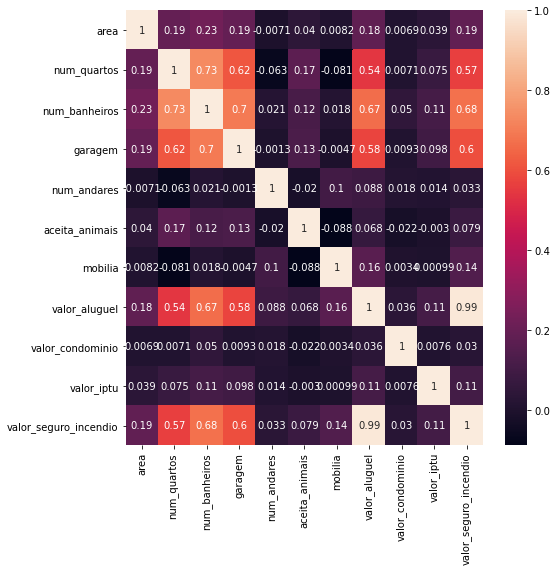

In [7]:
plt.figure(figsize =(8,8))
cor = data.corr()
sns.heatmap(cor,annot =True)

Visualizando as correlações em pares

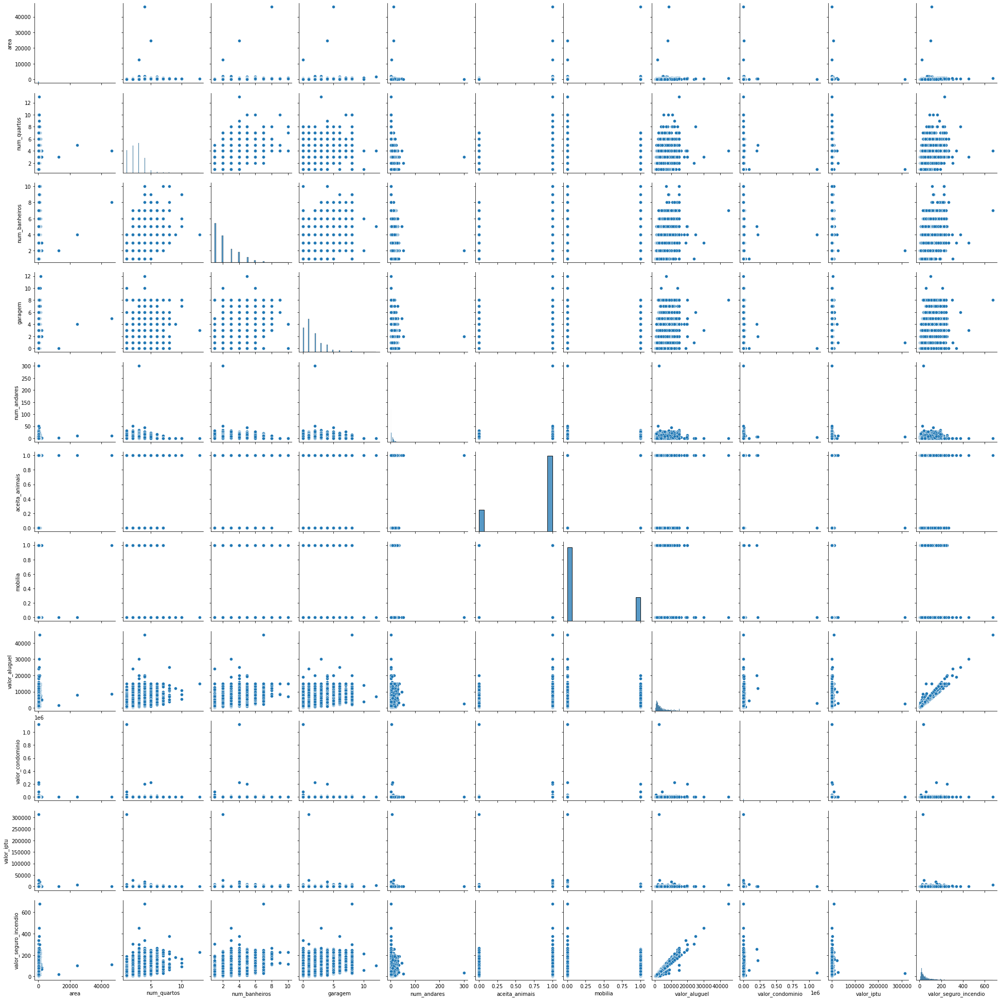

In [8]:
sns.pairplot(data)

In [9]:
!pip install sweetviz

In [10]:
import sweetviz as sv

my_report = sv.analyze(data,"valor_aluguel")
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



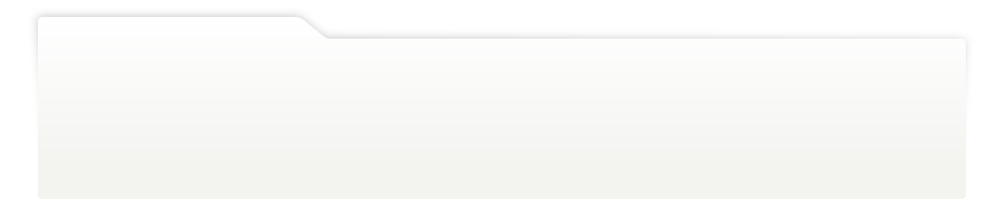
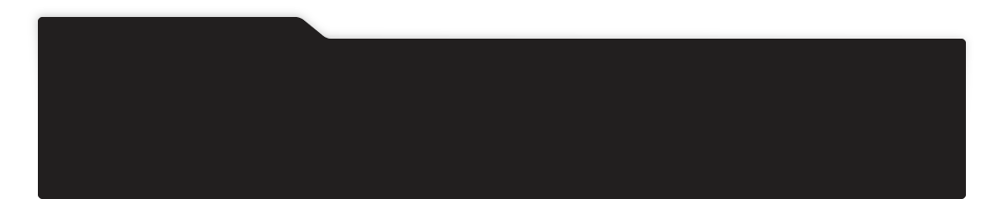
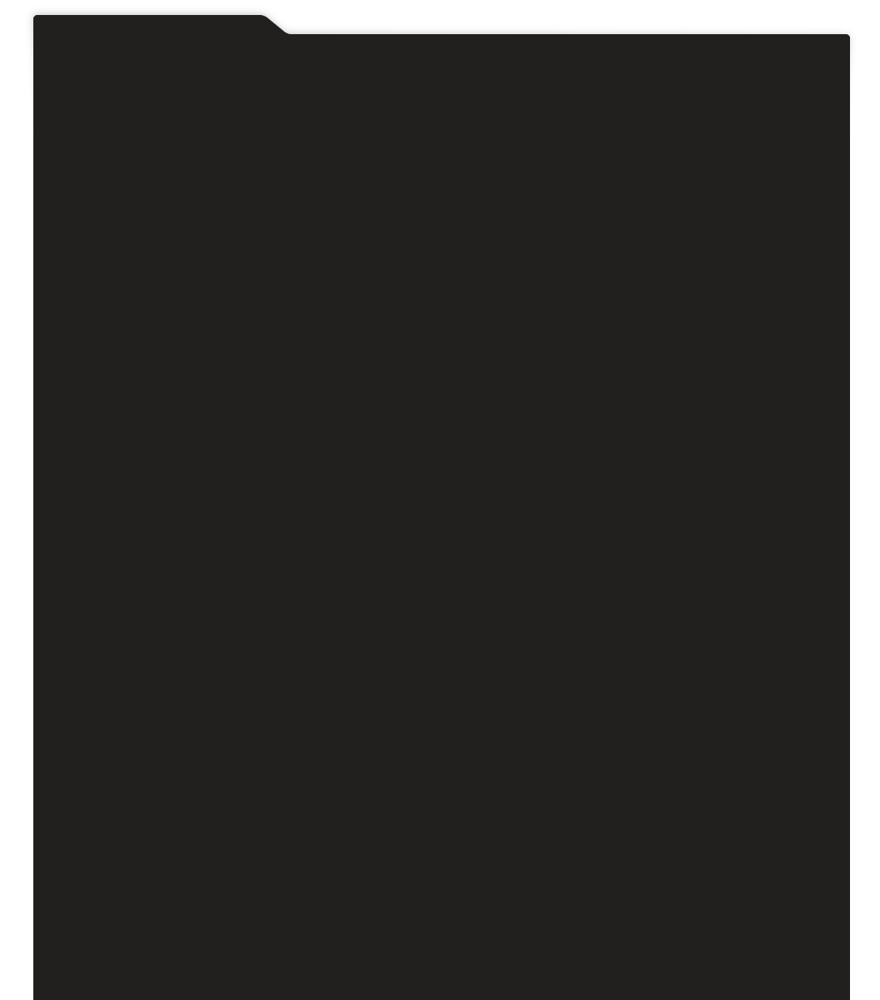
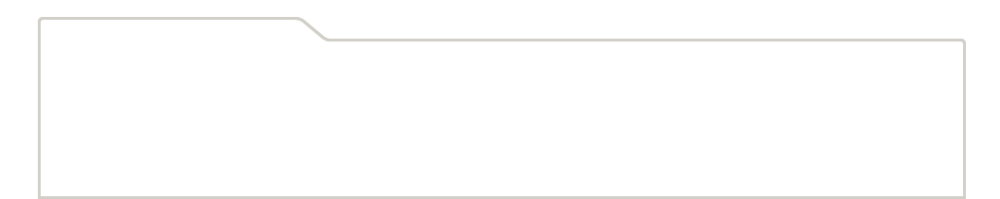
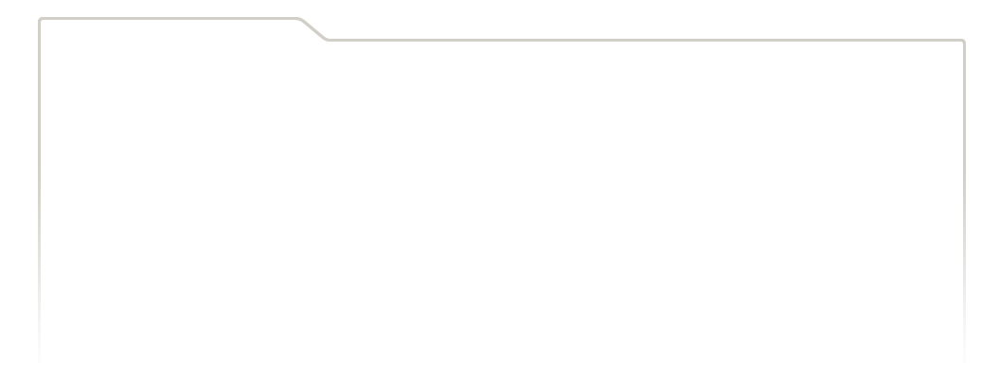
...
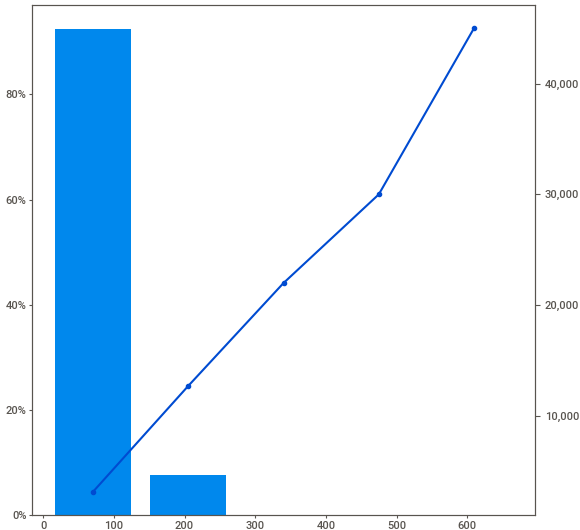
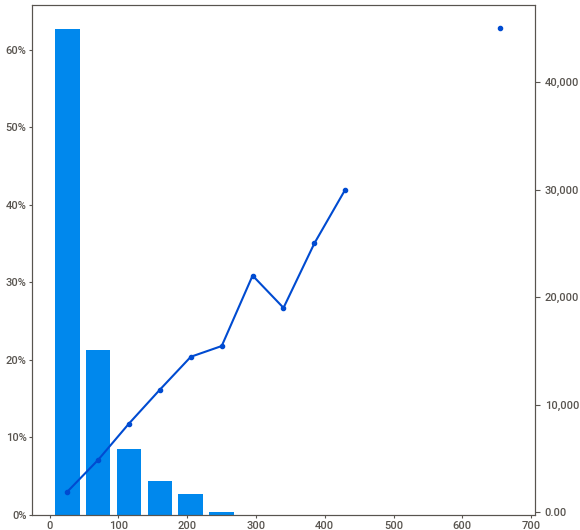
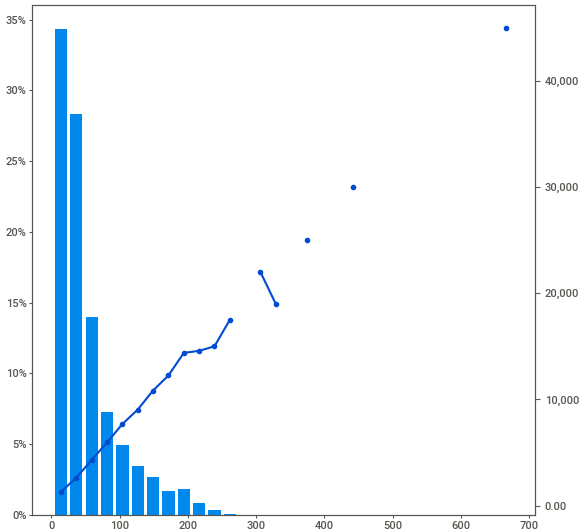
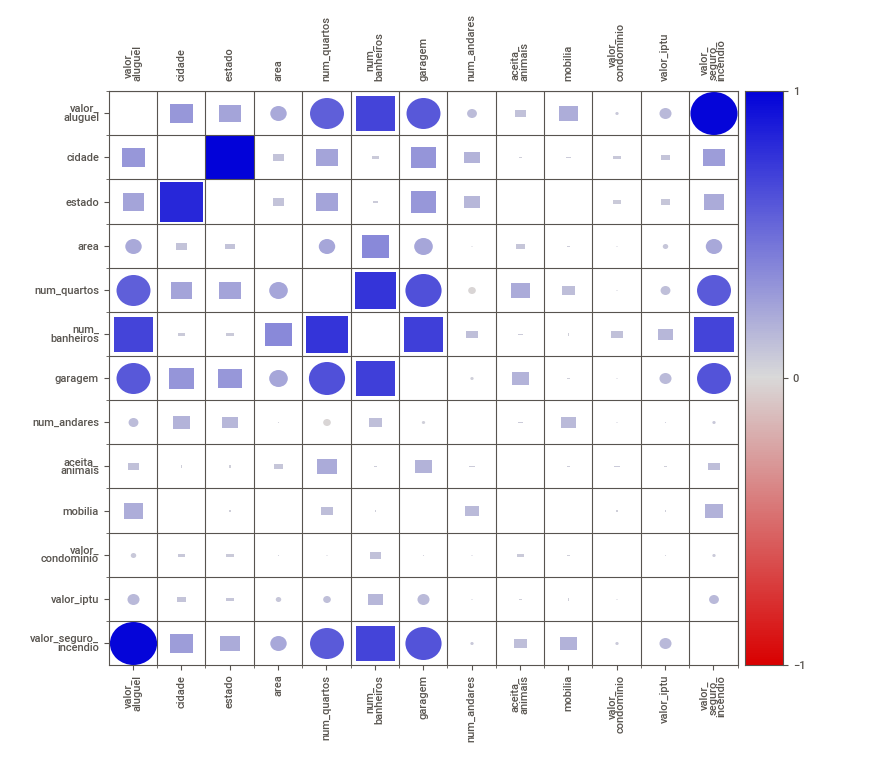
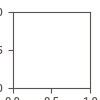

In [11]:
my_report.show_notebook()

# Como os valores de aluguel estão distribuidos?

Intalando o plotly para visualizações dinamicas

In [12]:
!pip3 install plotly

In [13]:
import plotly.express as px
fig = px.histogram(data, x="valor_aluguel", marginal="rug", hover_data=data.columns)
fig.show()

In [14]:
import plotly.express as px
fig = px.box(data, x="valor_aluguel", points="all")
fig.show()

Alguns insigths identificados...<br/>
1. Dados com uma assimetria positiva. <br/>
2. Possíveis outliers acima de 15.000,00. <br/>
3. A maioria dos valores estão na faixa de R$ 499 à 10.000,00.

<AxesSubplot:xlabel='valor_aluguel'>

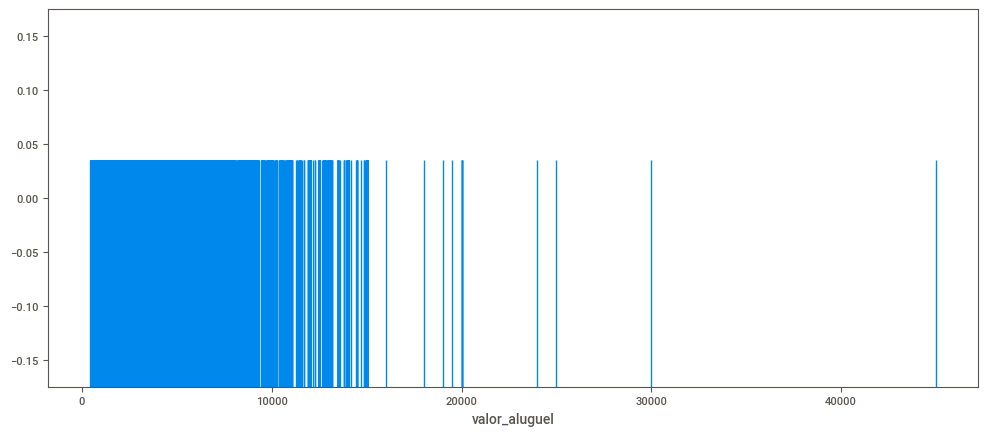

In [15]:
plt.figure(figsize =(12,5))
sns.rugplot(
            data['valor_aluguel'],
            height=0.6,    
            )

# Existe qualquer relação entre o número de quartos e o valor do aluguel?

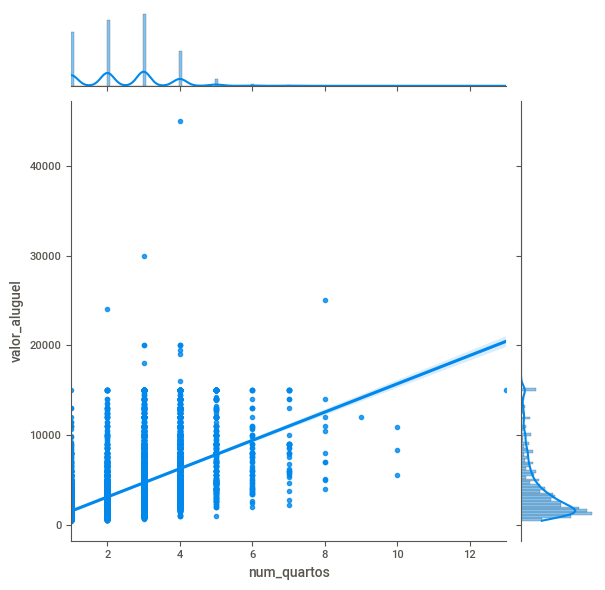

In [16]:
sns.jointplot(y= data['valor_aluguel'],x = data['num_quartos'],kind ='reg')

* Podemos observar que o número de quartos influencia no valor do aluguel.
* Os maiores imoveis mais caros são com números de quartos 3 e 4.
* Como uma regra geral temos uma relação positiva entre o número de imóveis e o valor do aluguel.

# O que podemos observar sobre a possibilidade de aceitar animais?

<AxesSubplot:xlabel='aceita_animais', ylabel='count'>

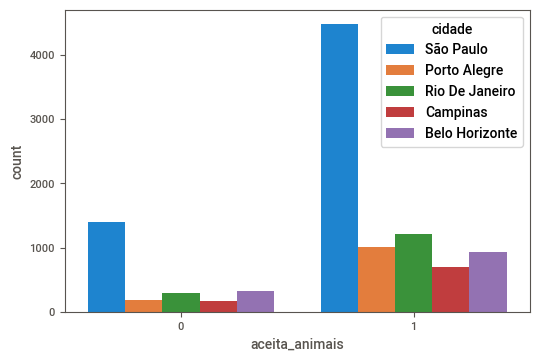

In [17]:
sns.countplot(x = data['aceita_animais']
              ,hue = data['cidade'])

In [18]:
data.head()

,cidade,estado,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio
0,São Paulo,SP,70,2,1,1,7,1,1,3300,2065,211,42
1,São Paulo,SP,320,4,4,0,20,1,0,4960,1200,1750,63
2,Porto Alegre,RS,80,1,1,1,6,1,0,2800,1000,0,41
3,Porto Alegre,RS,51,2,1,0,2,1,0,1112,270,22,17
4,São Paulo,SP,25,1,1,0,1,0,0,800,0,25,11


* Podemos observar que o número de imóveis que aceitam animais é bem maior do que os que não aceitam.

In [19]:
data["animal_categorical"] =  data['aceita_animais'].map({1:"aceita",0:"nao_aceita"})

<AxesSubplot:xlabel='valor_aluguel', ylabel='animal_categorical'>

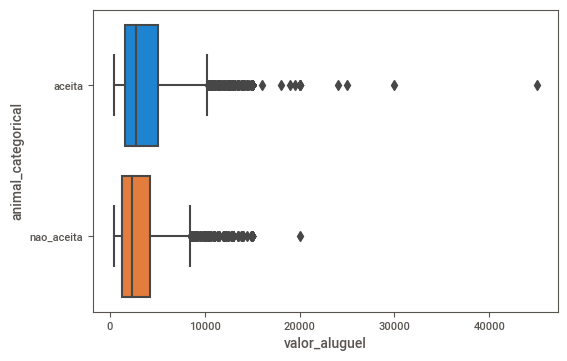

In [20]:
sns.boxplot( x = data['valor_aluguel']
            ,y = data['animal_categorical'])

* A maioria dos imóveis que aceitam animais, custam mais caros do que os que não aceitam.

# Cidades e os números de quartos

In [21]:
pd.DataFrame(data['cidade'].unique())

,0
0,São Paulo
1,Porto Alegre
2,Rio De Janeiro
3,Campinas
4,Belo Horizonte


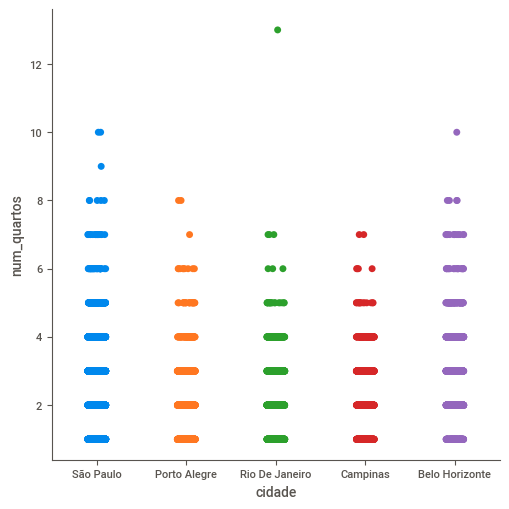

In [22]:
sns.catplot(x='cidade', y='num_quartos', data =data)

* Rio de Janeiro é a cidade com o maior número de quartos.

# Como estão distribuidos os imóveis por número de banheiros?

<AxesSubplot:xlabel='num_banheiros', ylabel='count'>

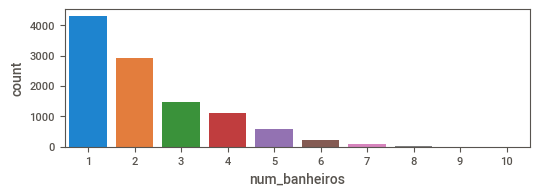

In [23]:
plt.subplot(2,1,1)
sns.countplot(x = data['num_banheiros'])

* A maioria dos imóveis contém de 1 a 2 banheiros.
* Existem poucos imóveis com 5 ou mais banheiros.

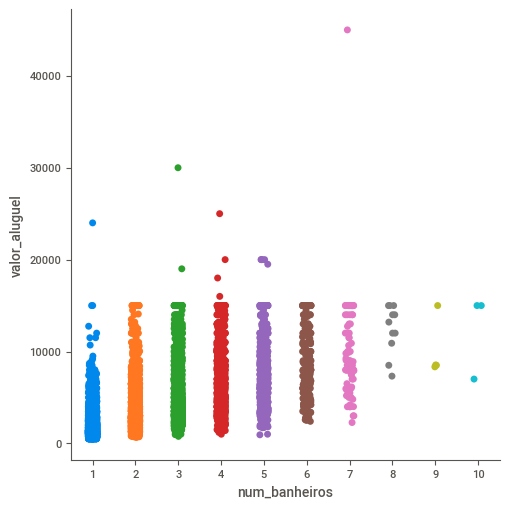

In [24]:
sns.catplot(x ='num_banheiros', y ='valor_aluguel', data = data)

* O maior aluguel é de um imóvel que tem 7 banheiros.
* Existem alugueis caros com imóveis com 1 a 4 banheiros.

# A mobília nos imoveis impactam no valor do aluguel?

In [25]:
data["mobilia_categorical"] =  data['mobilia'].map({1:"mobiliado",0:"nao_mobiliado"})

<AxesSubplot:xlabel='valor_aluguel', ylabel='mobilia_categorical'>

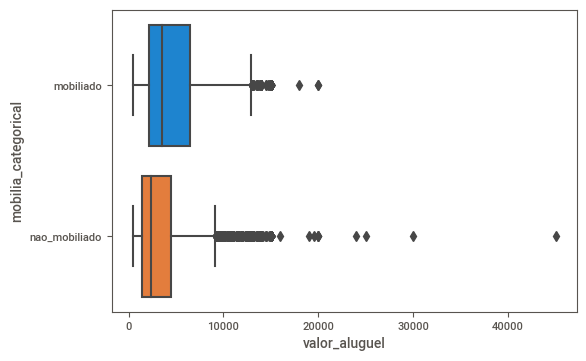

In [26]:
sns.boxplot( x = data['valor_aluguel']
            ,y = data['mobilia_categorical'])

* De todos os imóveis com valores maiores de aluguel, bem acima da média, são todos não mobiliados.
* O que justifica uma fraca correlação entre os atributos.

# Existe alguma relação entre o número de vagas de garagem e o valor do aluguel?

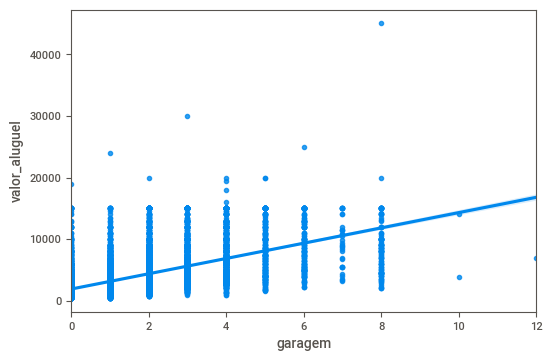

In [27]:
plt.figure(figsize =(6,4))
ax = sns.regplot(x = data['garagem'],y = data['valor_aluguel'])

<Figure size 600x400 with 0 Axes>

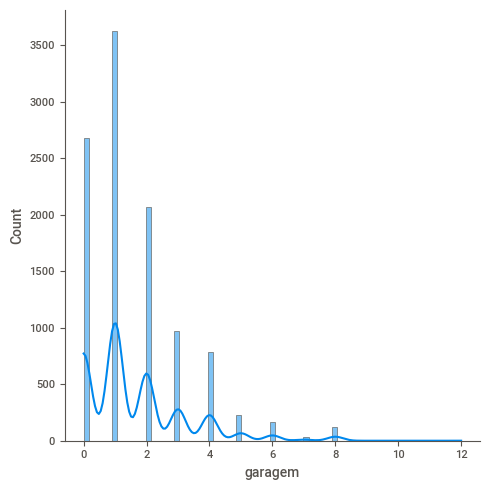

In [28]:
plt.figure(figsize =(6,4))
sns.displot(x = data['garagem'], kde = True)

Existe uma pequena correlação entre o número de vagas de garagem e o valor do aluguel.

# Vamos analisar o seguro incêndio

<AxesSubplot:xlabel='cidade', ylabel='valor_seguro_incendio'>

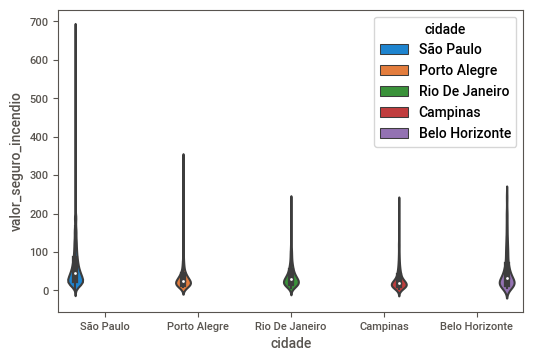

In [29]:
sns.violinplot(x ='cidade', y ='valor_seguro_incendio', data = data,hue ='cidade')

* São Paulo é a cidade com os maiores valores de seguro incêndio, seguido por Porto Alegre, Belo Horizonte, Rio de Janeiro e Campinas.

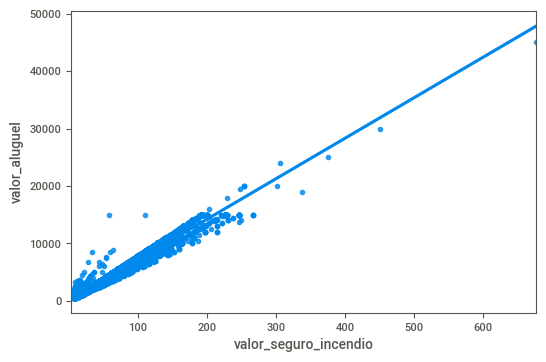

In [30]:
ax = sns.regplot(x = data['valor_seguro_incendio'],y = data['valor_aluguel'])

* Existe uma alta correlação entre o valor do seguro incendio e o valor do aluguel. 
* Quanto maior o valor do seguro incendio maior o valor do aluguel.

# Existe qualquer relação entre o valor do iptu e o valor do aluguel?

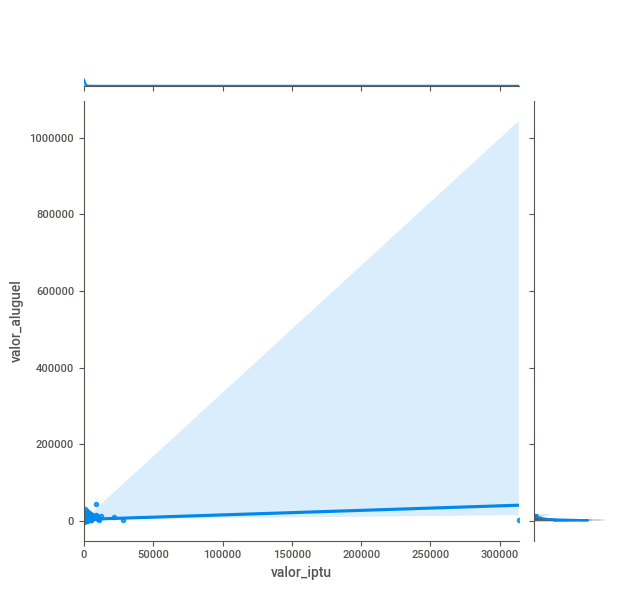

In [31]:
sns.jointplot(y= data['valor_aluguel'],x = data['valor_iptu'],kind ='reg')

* Não temos nenhum impacto

**Pré-processando os dados**

Poucos algoritmos trabalham com dados categóricos, por essas variáveis serem importantes para o nosso modelo precisamos transformar dados categóricos em dados numéricos para poder usar os algoritmos de Machine Learning

Podemos usar duas técnicas bem eficientes que são:

- **Label Encoder**
- **One Hot Enconder**

Verificando a quantidade de valores únicos na coluna estado

In [32]:
data.estado.unique()

array(['SP', 'RS', 'RJ', 'MG'], dtype=object)

Verificando a quantidade de valores únicos na coluna cidade

In [33]:
data.cidade.unique()

array(['São Paulo', 'Porto Alegre', 'Rio De Janeiro', 'Campinas',
       'Belo Horizonte'], dtype=object)

**Aplicando o One Hot Encoder**

Subistituindo o dataframe data pelo dataframe após aplicado o get_dummies()

In [34]:
data = pd.get_dummies(data, columns=["estado","cidade"], prefix=["estado_","cidade_"])

In [35]:
data.head()

,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,...,mobilia_categorical,estado__MG,estado__RJ,estado__RS,estado__SP,cidade__Belo Horizonte,cidade__Campinas,cidade__Porto Alegre,cidade__Rio De Janeiro,cidade__São Paulo
0,70,2,1,1,7,1,1,3300,2065,211,...,mobiliado,0,0,0,1,0,0,0,0,1
1,320,4,4,0,20,1,0,4960,1200,1750,...,nao_mobiliado,0,0,0,1,0,0,0,0,1
2,80,1,1,1,6,1,0,2800,1000,0,...,nao_mobiliado,0,0,1,0,0,0,1,0,0
3,51,2,1,0,2,1,0,1112,270,22,...,nao_mobiliado,0,0,1,0,0,0,1,0,0
4,25,1,1,0,1,0,0,800,0,25,...,nao_mobiliado,0,0,0,1,0,0,0,0,1


In [36]:
data.columns

Index(['area', 'num_quartos', 'num_banheiros', 'garagem', 'num_andares',
       'aceita_animais', 'mobilia', 'valor_aluguel', 'valor_condominio',
       'valor_iptu', 'valor_seguro_incendio', 'animal_categorical',
       'mobilia_categorical', 'estado__MG', 'estado__RJ', 'estado__RS',
       'estado__SP', 'cidade__Belo Horizonte', 'cidade__Campinas',
       'cidade__Porto Alegre', 'cidade__Rio De Janeiro', 'cidade__São Paulo'],
      dtype='object')

# Detecção de Outliers, Machine Learning

Excluindo os atributos categoricos

In [37]:
data.drop(["animal_categorical","mobilia_categorical"], axis=1, inplace=True)

Outlier Detection

Verificando os registros anomalos no atributo valor_aluguel

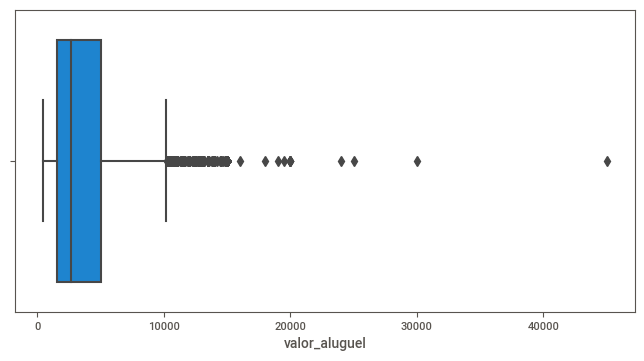

In [38]:
plt.figure(figsize=(8, 4))
sns.boxplot(x=data['valor_aluguel'])
plt.show()

In [39]:
data.describe()

,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio,estado__MG,estado__RJ,estado__RS,estado__SP,cidade__Belo Horizonte,cidade__Campinas,cidade__Porto Alegre,cidade__Rio De Janeiro,cidade__São Paulo
count,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,1.069200e+04,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000,10692.000000
mean,149.217920,2.506079,2.236813,1.609147,5.298167,0.777778,0.243734,3896.247194,1.174022e+03,366.704358,53.300879,0.117658,0.140385,0.111579,0.630378,0.117658,0.079779,0.111579,0.140385,0.550599
std,537.016942,1.171266,1.407198,1.589521,5.888747,0.415759,0.429354,3408.545518,1.559231e+04,3107.832321,47.768031,0.322218,0.347403,0.314862,0.482725,0.322218,0.270964,0.314862,0.347403,0.497456
min,11.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,450.000000,0.000000e+00,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,56.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1530.000000,1.700000e+02,38.000000,21.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,90.000000,2.000000,2.000000,1.000000,3.000000,1.000000,0.000000,2661.000000,5.600000e+02,125.000000,36.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,182.000000,3.000000,3.000000,2.000000,8.000000,1.000000,0.000000,5000.000000,1.237500e+03,375.000000,68.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,46335.000000,13.000000,10.000000,12.000000,301.000000,1.000000,1.000000,45000.000000,1.117000e+06,313700.000000,677.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Quantil 1 = 25% dos dados.

In [40]:
Q1 = data["valor_aluguel"].quantile(.25)

Quantil 3 = 75% dos dados.

In [41]:
Q3 = data["valor_aluguel"].quantile(.75)

In [42]:
Q1,Q3

(1530.0, 5000.0)

Faixa de Intervalo Interqualítico

In [43]:
IQR = Q3 - Q1

In [44]:
IQR

3470.0

Calculando os limites

In [45]:
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

In [46]:
lower,upper

(-3675.0, 10205.0)

Definindo a seleção dos registros

In [47]:
data_clean = data[data['valor_aluguel'] >= lower] 

In [48]:
data_clean = data_clean[data_clean['valor_aluguel'] <= upper]

In [49]:
data_clean.describe()

,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio,estado__MG,estado__RJ,estado__RS,estado__SP,cidade__Belo Horizonte,cidade__Campinas,cidade__Porto Alegre,cidade__Rio De Janeiro,cidade__São Paulo
count,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9.977000e+03,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000
mean,134.480204,2.415957,2.092413,1.466573,5.243460,0.774882,0.235341,3221.233337,1.068422e+03,301.399218,43.940664,0.117570,0.144833,0.117169,0.620427,0.117570,0.083993,0.117169,0.144833,0.536434
std,550.667527,1.122319,1.289368,1.471634,5.842044,0.417681,0.424233,2296.025341,1.585605e+04,3190.804271,32.114269,0.322115,0.351950,0.321638,0.485305,0.322115,0.277391,0.321638,0.351950,0.498696
min,11.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,450.000000,0.000000e+00,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,55.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1500.000000,1.910000e+02,34.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,85.000000,2.000000,2.000000,1.000000,3.000000,1.000000,0.000000,2500.000000,5.500000e+02,110.000000,33.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,160.000000,3.000000,3.000000,2.000000,8.000000,1.000000,0.000000,4250.000000,1.119000e+03,307.000000,58.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,46335.000000,10.000000,10.000000,12.000000,301.000000,1.000000,1.000000,10200.000000,1.117000e+06,313700.000000,178.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


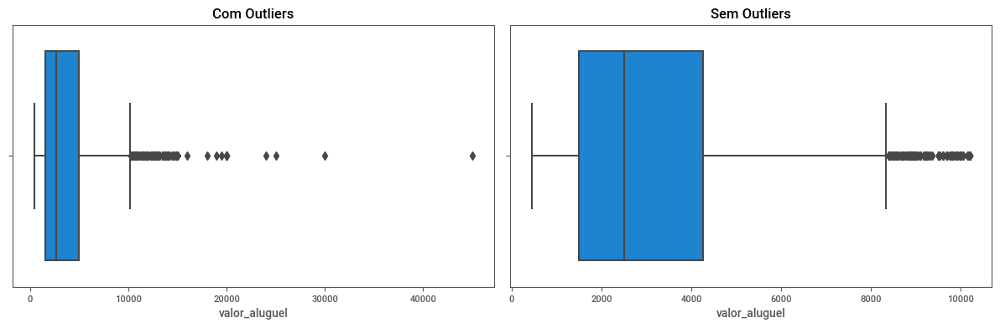

In [50]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.title('Com Outliers')
sns.boxplot(x= data['valor_aluguel'])

plt.subplot(1, 2, 2)
plt.title('Sem Outliers')
sns.boxplot(x= data_clean['valor_aluguel'])

plt.tight_layout(pad=1.0)
plt.show()

In [51]:
data_clean.describe()

,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio,estado__MG,estado__RJ,estado__RS,estado__SP,cidade__Belo Horizonte,cidade__Campinas,cidade__Porto Alegre,cidade__Rio De Janeiro,cidade__São Paulo
count,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9.977000e+03,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000,9977.000000
mean,134.480204,2.415957,2.092413,1.466573,5.243460,0.774882,0.235341,3221.233337,1.068422e+03,301.399218,43.940664,0.117570,0.144833,0.117169,0.620427,0.117570,0.083993,0.117169,0.144833,0.536434
std,550.667527,1.122319,1.289368,1.471634,5.842044,0.417681,0.424233,2296.025341,1.585605e+04,3190.804271,32.114269,0.322115,0.351950,0.321638,0.485305,0.322115,0.277391,0.321638,0.351950,0.498696
min,11.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,450.000000,0.000000e+00,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,55.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1500.000000,1.910000e+02,34.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,85.000000,2.000000,2.000000,1.000000,3.000000,1.000000,0.000000,2500.000000,5.500000e+02,110.000000,33.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,160.000000,3.000000,3.000000,2.000000,8.000000,1.000000,0.000000,4250.000000,1.119000e+03,307.000000,58.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,46335.000000,10.000000,10.000000,12.000000,301.000000,1.000000,1.000000,10200.000000,1.117000e+06,313700.000000,178.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Unificando os dataframes

In [52]:
data = data_clean

# Machine Learning

Separando os dados em features e classes.

In [53]:
y = data['valor_aluguel']
x = data.drop(['valor_aluguel'],axis =1)

Separando os conjuntos de treino e teste.

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [55]:
def calcula_metricas(y_test,preds):
    print('MAE:', mean_absolute_error(y_test, preds))
    print('RMSE:', np.sqrt(mean_squared_error(y_test, preds)))
    print('R2:', r2_score(y_test, preds))

In [56]:
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size =0.3)

In [57]:
acc=[]

**Calculando a nossa Baseline**

In [58]:
from sklearn.dummy import DummyRegressor

In [80]:
model = DummyRegressor(strategy="mean")

Iniciando o treinamento.

In [81]:
model.fit(X_train,y_train)

DummyRegressor()

Fazendo as predições

In [82]:
preds = model.predict(X_test)

Calculando as métricas.

In [83]:
calcula_metricas(y_test,preds)

MAE: 1811.1225312336446
RMSE: 2295.291548292421
R2: -1.721272783639094e-06


Armazendo o resultado.

In [87]:
acc.append(
            [
              'BAS', r2_score(y_test,preds)
            ]
          )

In [88]:
acc

[['BAS', -1.721272783639094e-06]]

#### Treinando um modelo de Regressão Linear

Instanciando o estimator.

In [89]:
from sklearn.linear_model import LinearRegression

In [90]:
model = LinearRegression()

Iniciando o treinamento.

In [91]:
model.fit(X_train,y_train)

LinearRegression()

Fazendo as predições

In [92]:
preds = model.predict(X_test)

Calculando as métricas.

In [93]:
calcula_metricas(y_test,preds)

MAE: 272.8893957924769
RMSE: 2743.397559717842
R2: -0.4285732985178765


Armazendo o resultado.

In [94]:
acc.append(
            [
              'LIR', r2_score(y_test,preds)
            ]
          )

In [95]:
acc

[['BAS', -1.721272783639094e-06], ['LIR', -0.4285732985178765]]

Decision Tree Regression

In [96]:
from sklearn.tree import DecisionTreeRegressor

Iniciando o treinamento.

In [97]:
model = DecisionTreeRegressor()
model.fit(X_train,y_train)

DecisionTreeRegressor()

Fazendo as predições

In [98]:
preds = model.predict(X_test)

Calculando as métricas.

In [99]:
calcula_metricas(y_test,preds)

MAE: 73.20975283901136
RMSE: 258.1059734590011
R2: 0.9873549327341208


Armazendo o resultado.

In [100]:
acc.append(['DTR',r2_score(y_test,preds)])

In [101]:
acc

[['BAS', -1.721272783639094e-06],
 ['LIR', -0.4285732985178765],
 ['DTR', 0.9873549327341208]]

Random Forest

In [102]:
from sklearn.ensemble import RandomForestRegressor

Iniciando o treinamento.

In [103]:
model = RandomForestRegressor()
model.fit(X_train,y_train)

RandomForestRegressor()

Fazendo as predições

In [104]:
preds = model.predict(X_test)

Calculando as métricas.

In [105]:
calcula_metricas(y_test,preds)

MAE: 69.45334782528019
RMSE: 195.25663914920383
R2: 0.992763365272101


Armazendo o resultado.

In [106]:
acc.append(['RFN',r2_score(y_test,model.predict(X_test))])

In [107]:
acc

[['BAS', -1.721272783639094e-06],
 ['LIR', -0.4285732985178765],
 ['DTR', 0.9873549327341208],
 ['RFN', 0.992763365272101]]

KNN Regressor

In [108]:
from sklearn.neighbors import KNeighborsRegressor

Iniciando o treinamento.

In [109]:
model = KNeighborsRegressor()
model.fit(X_train,y_train)

KNeighborsRegressor()

Fazendo as predições

In [110]:
preds = model.predict(X_test)

Calculando as métricas.

In [111]:
calcula_metricas(y_test,preds)

MAE: 691.6616566466266
RMSE: 1088.4496138838617
R2: 0.7751247331273641


Armazendo o resultado.

In [112]:
acc.append(['KNNR',r2_score(y_test,model.predict(X_test))])

In [113]:
acc

[['BAS', -1.721272783639094e-06],
 ['LIR', -0.4285732985178765],
 ['DTR', 0.9873549327341208],
 ['RFN', 0.992763365272101],
 ['KNNR', 0.7751247331273641]]

Ordenando os resultados.

In [114]:
acc.sort(key = lambda y:y[1],reverse =True)

In [115]:
acc

[['RFN', 0.992763365272101],
 ['DTR', 0.9873549327341208],
 ['KNNR', 0.7751247331273641],
 ['BAS', -1.721272783639094e-06],
 ['LIR', -0.4285732985178765]]

## Pycaret

In [5]:
!pip install pycaret==2.2

     |████████████████████████████████| 248 kB 2.1 MB/s eta 0:00:01
     |████████████████████████████████| 81 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.3 MB 3.3 MB/s eta 0:00:01
     |████████████████████████████████| 371 kB 1.7 MB/s eta 0:00:01
     |████████████████████████████████| 80 kB 1.0 MB/s eta 0:00:01
     |████████████████████████████████| 13.2 MB 4.2 MB/s eta 0:00:01
     |████████████████████████████████| 69.2 MB 247 kB/s eta 0:00:01    |▏                               | 317 kB 1.2 MB/s eta 0:00:58
     |████████████████████████████████| 271 kB 1.4 MB/s eta 0:00:01
     |████████████████████████████████| 206 kB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 636 kB 1.3 MB/s eta 0:00:01
     |████████████████████████████████| 104 kB 2.6 MB/s eta 0:00:01
     |████████████████████████████████| 248 kB 2.5 MB/s eta 0:00:01
     |████████████████████████████████| 166.7 MB 25 kB/s  eta 0:00:011   |██████████                      | 51.9 MB 3.

     |████████████████████████████████| 102 kB 6.5 MB/s eta 0:00:01
     |████████████████████████████████| 13.7 MB 3.0 MB/s eta 0:00:01    |███████▋                        | 3.2 MB 7.1 MB/s eta 0:00:02
     |████████████████████████████████| 3.1 MB 5.6 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 6.3 MB/s eta 0:00:01
     |████████████████████████████████| 295 kB 4.1 MB/s eta 0:00:01
     |████████████████████████████████| 14.9 MB 3.3 MB/s eta 0:00:01
     |████████████████████████████████| 57 kB 1.0 MB/s eta 0:00:011
     |████████████████████████████████| 1.1 MB 3.9 MB/s eta 0:00:01
     |████████████████████████████████| 79 kB 1.1 MB/s eta 0:00:011
     |████████████████████████████████| 54 kB 418 kB/s eta 0:00:011


     |████████████████████████████████| 146 kB 4.1 MB/s eta 0:00:01
     |████████████████████████████████| 42 kB 128 kB/s  eta 0:00:01
     |████████████████████████████████| 75 kB 656 kB/s eta 0:00:011
     |████████████████████████████████| 68 kB 1.1 MB/s eta 0:00:011
     |████████████████████████████████| 1.7 MB 5.9 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.7 MB 4.5 MB/s eta 0:00:01
     |████████████████████████████████| 9.8 MB 11 kB/s  eta 0:00:01     |███████████████████████         | 7.0 MB 2.9 MB/s eta 0:00:01
     |████████████████████████████████| 628 kB 5.2 MB/s eta 0:00:01
     |████████████████████████████████| 12.9 MB 2.9 MB/s eta 0:00:01
     |████████████████████████████████| 458 kB 5.8 MB/s eta 0:00:01
     |████████████████████████████████| 12.9 MB 116 kB/s eta 0:00:01    |██████████

     |████████████████████████████████| 1.1 MB 1.5 MB/s eta 0:00:01
  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=67922 sha256=384c5a5b87b8c4834d57ca377bdee338423c3f32f21a2b7164a7eee74dabcaea
  Stored in directory: /home/zod/.cache/pip/wheels/6b/76/62/6da97734911ffcbdd559fd1a3f28526321f0ae699182a23866
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27085 sha256=0bad0b71e5264f6c938a451c0a13e06425b4bd8b82ede34fb43cb00e5306cb96
  Stored in directory: /home/zod/.cache/pip/wheels/23/14/6e/4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
  Created wheel for phik: filename=phik-0.11.2-py3-none-any.whl size=1107412 sha256=461357063501113d83a8adecad9f36d43fbcabb6f54196b06945bba9a76561e4
  Stored in directory: /home/zod/.cache/pip/wheels/72/9a/23/097c93fd8341220d92674891b6a9a30f0e389719d9b7291bd2
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11429 sha256=2eef6c2f90d2768a11274c032a7c2e25d7928bd5fbae0b9d222

In [6]:
connect_dw_imoveis = sqlite3.connect("../data/imoveis_dw.db")

In [7]:
data2 = pd.read_sql_query(r"""
    SELECT * FROM IMOVEIS
    """, 
    connect_dw_imoveis
    )

In [8]:
data2.head()

,cidade,estado,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_aluguel,valor_condominio,valor_iptu,valor_seguro_incendio
0,São Paulo,SP,70,2,1,1,7,1,1,3300,2065,211,42
1,São Paulo,SP,320,4,4,0,20,1,0,4960,1200,1750,63
2,Porto Alegre,RS,80,1,1,1,6,1,0,2800,1000,0,41
3,Porto Alegre,RS,51,2,1,0,2,1,0,1112,270,22,17
4,São Paulo,SP,25,1,1,0,1,0,0,800,0,25,11


In [9]:
from pycaret.regression import *

In [12]:
s = setup( data2
          ,target = 'valor_aluguel'
          ,numeric_features = [ 'num_quartos'
                               ,'num_banheiros'
                               ,'garagem'
                               ,'num_andares'
                               ,'aceita_animais'
                               ,'mobilia']
          ,log_experiment = True
          ,fold_shuffle = True
          ,experiment_name = 'exp-bootcamp'
         )

,Description,Value
0,session_id,1802
1,Target,valor_aluguel
2,Original Data,"(10692, 13)"
3,Missing Values,False
4,Numeric Features,10
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(7484, 16)"


2021/06/18 12:40:43 WARNING mlflow.tracking.context.git_context: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh()

All git commands will error until this is rectified.

This initial warning can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|none|n|0: for no warning or exception
    - warn|w|warning|1: for a printed warning
    - error|e|raise|r|2: for a raised exception

Example:
    export GIT_PYTHON_REFRESH=quiet



AttributeError: 'Simple_Imputer' object has no attribute 'fill_value_categorical'

Vamos comparar os modelos

In [13]:
best = compare_models(fold = 5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,123.0592,141304.9971,353.6644,0.9884,0.0934,0.0443,0.4000
catboost,CatBoost Regressor,98.7171,142143.3322,349.7035,0.9883,0.0863,0.0353,2.5080
et,Extra Trees Regressor,87.7343,151498.0929,356.3441,0.9876,0.0866,0.0298,0.7480
xgboost,Extreme Gradient Boosting,105.8023,151694.9742,367.3316,0.9875,0.0922,0.0371,1.3440
rf,Random Forest Regressor,93.4424,174107.4253,388.9037,0.9857,0.0912,0.0311,1.1040
lightgbm,Light Gradient Boosting Machine,112.1229,191518.1805,397.9945,0.9844,0.0853,0.0362,0.7500
dt,Decision Tree Regressor,102.0036,257020.8412,490.6819,0.9782,0.1215,0.0361,0.0380
llar,Lasso Least Angle Regression,315.6502,290776.0207,538.5112,0.9751,0.1327,0.0897,0.0180
omp,Orthogonal Matching Pursuit,338.2573,302645.0509,548.4985,0.9741,0.1376,0.0898,0.0200
lar,Least Angle Regression,312.1639,559935.5778,703.8618,0.9505,0.1528,0.0987,0.0260


Listando os modelos

In [14]:
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


Selecionando o melhor algoritmo

In [15]:
catboost = create_model('catboost', fold = 5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,108.7230,372022.1083,609.9362,0.9707,0.0890,0.0351
1,93.1753,54960.3598,234.4363,0.9950,0.0883,0.0356
2,93.3452,50267.1243,224.2033,0.9952,0.0775,0.0341
3,101.9893,93642.5656,306.0107,0.9920,0.0940,0.0384
4,96.3527,139824.5031,373.9311,0.9888,0.0825,0.0335
Mean,98.7171,142143.3322,349.7035,0.9883,0.0863,0.0353
SD,5.9327,119368.3889,140.8928,0.0091,0.0057,0.0017


Otimizando o modelo

In [122]:
tuned_et = tune_model(catboost,fold=5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,89.4880,45405.4963,213.0857,0.9913,0.0894,0.0413
1,94.0708,44500.7273,210.9520,0.9915,0.0948,0.0404
2,87.3745,33230.5654,182.2925,0.9937,0.0891,0.0413
3,85.9741,57728.7833,240.2681,0.9884,0.0831,0.0395
4,88.7774,60350.4741,245.6633,0.9892,0.0868,0.0365
Mean,89.1370,48243.2093,218.4523,0.9908,0.0887,0.0398
SD,2.7461,9838.7015,22.8428,0.0019,0.0038,0.0018


Visualizando os residuais

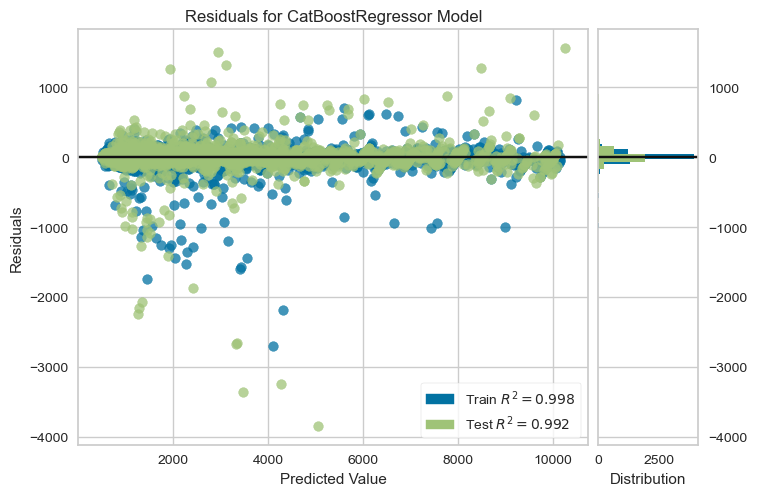

In [123]:
plot_model(catboost)

Visualizando o erro do modelo

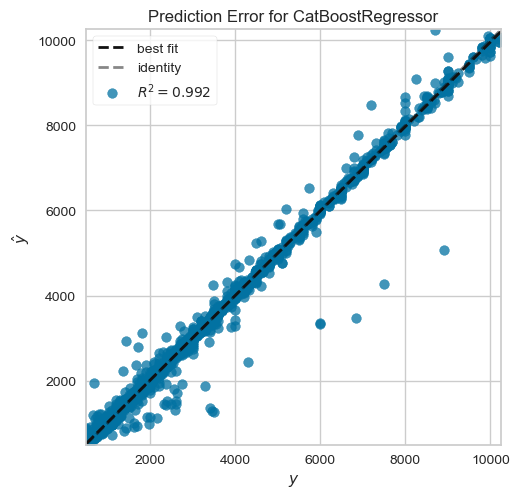

In [124]:
plot_model(catboost, plot = 'error')

Visualizando as features importantes

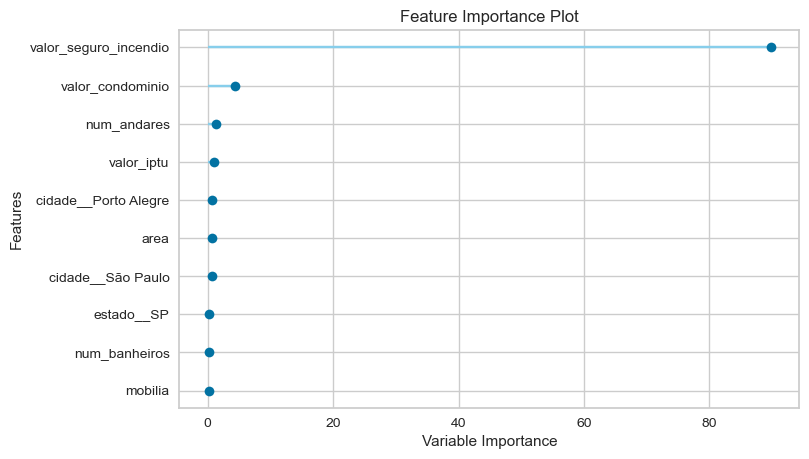

In [125]:
plot_model(catboost, plot='feature')

Finaliza o modelo

In [219]:
final_catboost = finalize_model(catboost)

Salva o modelo

In [220]:
save_model(final_catboost,'modelo-final')

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=['num_quartos',
                                                           'num_banheiros',
                                                           'garagem',
                                                           'num_andares',
                                                           'aceita_animais',
                                                           'mobilia'],
                                       target='valor_aluguel',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy=...
                 ('cluster_all', 'passthrough'),
                 ('dummy', 

In [221]:
!ls

aula3.ipynb      explorer.ipynb   mlruns
catboost_info    logs.log         modelo-final.pkl


### Test Time

In [222]:
model_test = load_model('modelo-final')

Transformation Pipeline and Model Successfully Loaded


In [224]:
data_teste = data2.drop(["valor_aluguel"],axis=1)

In [225]:
predict_model(model_test, data=data_teste)

,cidade,estado,area,num_quartos,num_banheiros,garagem,num_andares,aceita_animais,mobilia,valor_condominio,valor_iptu,valor_seguro_incendio,Label
0,São Paulo,SP,70,2,1,1,7,1,1,2065,211,42,3251.080221
1,São Paulo,SP,320,4,4,0,20,1,0,1200,1750,63,5182.561268
2,Porto Alegre,RS,80,1,1,1,6,1,0,1000,0,41,2831.763376
3,Porto Alegre,RS,51,2,1,0,2,1,0,270,22,17,1139.788577
4,São Paulo,SP,25,1,1,0,1,0,0,0,25,11,770.387577
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10687,Porto Alegre,RS,63,2,1,1,5,0,1,402,24,22,1493.439409
10688,São Paulo,SP,285,4,4,4,17,1,0,3100,973,191,15001.321777
10689,Rio De Janeiro,RJ,70,3,3,0,8,0,1,980,332,78,5924.991360
10690,Rio De Janeiro,RJ,120,2,2,2,8,1,1,1585,279,155,11956.417129
